In [37]:
import pandas as pd
import altair as alt
import numpy as np
from altair import datum
import json
%matplotlib inline

alt.data_transformers.disable_max_rows()
alt.themes.enable('latimes')

ThemeRegistry.enable('latimes')

# 1. Loading the dataset

In [38]:
gdp = pd.read_csv('GDP.csv', skiprows=[i for i in range(0,4)])

# 2. Wrangling the dataset

In [39]:
# Handling null values and deleting non usable information.
gdp.drop(gdp.index[0], inplace=True)
gdp['Geography'] = gdp['Geography'].fillna(method='ffill')
gdp['North American Industry Classification System (NAICS) 7 8'] = gdp['North American Industry Classification System (NAICS) 7 8'].fillna(method='ffill')
gdp.reset_index(inplace=True)
gdp.drop('index', axis=1, inplace=True)
gdp = gdp[:-27]
gdp = gdp.replace(',','', regex=True)
gdp.replace(to_replace ="..", value ="0", inplace= True) 

# Indicating the correct data types
gdp['North American Industry Classification System (NAICS) 7 8'] = gdp['North American Industry Classification System (NAICS) 7 8'].str.split('[').str[0]
gdp['Geography'] = gdp['Geography'].astype('string')
gdp['North American Industry Classification System (NAICS) 7 8'] = gdp['North American Industry Classification System (NAICS) 7 8'].astype('string')
gdp['Reference period'] = pd.to_numeric(gdp['Reference period'])
gdp['Chained (2012) dollars 9'] = pd.to_numeric(gdp['Chained (2012) dollars 9'])

# Renaming the columns
gdp.rename(columns={"North American Industry Classification System (NAICS) 7 8": "Industry", "Reference period": "Year", "Chained (2012) dollars 9": "GDP"}, inplace=True)

# Adding the growth rates columns
gdp['Percent Change'] = gdp.GDP.pct_change()
gdp.loc[gdp.Year == 1997, "Percent Change"] = 0

gdp.head()

,Geography,Industry,Year,GDP,Percent Change
0,Newfoundland and Labrador,Goods-producing industries,1997.0,6353.5,0.000000
1,Newfoundland and Labrador,Goods-producing industries,1998.0,7175.6,0.129393
2,Newfoundland and Labrador,Goods-producing industries,1999.0,8293.9,0.155848
3,Newfoundland and Labrador,Goods-producing industries,2000.0,9305.3,0.121945
4,Newfoundland and Labrador,Goods-producing industries,2001.0,9596.3,0.031273


In [40]:
import geopandas as gpd
can = gpd.GeoDataFrame.from_file("lpr_000b16a_e.shp")
merged=can.set_index('PRENAME').join(gdp.set_index('Geography'))
merged.reset_index(inplace=True)
merged.drop('index', axis=1, inplace=True)

merged.head()

,PRUID,PRNAME,PRFNAME,PREABBR,PRFABBR,geometry,Industry,Year,GDP,Percent Change
0,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",Goods-producing industries,1997.0,96516.6,0.000000
1,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",Goods-producing industries,1998.0,97054.5,0.005573
2,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",Goods-producing industries,1999.0,97399.2,0.003552
3,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",Goods-producing industries,2000.0,103442.3,0.062045
4,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",Goods-producing industries,2001.0,102701.0,-0.007166


In [41]:
#data  = alt.InlineData(values = merged.to_json(),format = alt.DataFormat(property='features',type='json')) 

# 3. Dropdown menu items

In [42]:
year = 2019
Geography = 'Ontario'

# 4. Visualizations

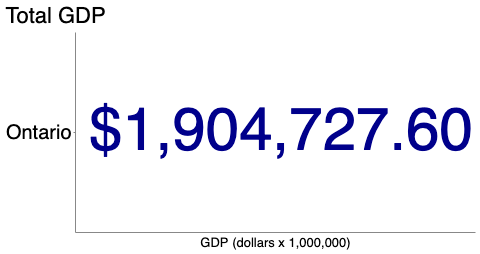

In [55]:
bar = alt.Chart(gdp, title="Total GDP ").mark_bar(size=80).transform_aggregate(
        groupby =['Geography', 'Year'], GDP='sum(GDP)').encode(
            x=alt.X('sum(GDP):Q', title='GDP (dollars x 1,000,000)', axis=alt.Axis(grid=False, ticks=False, labels=False, labelFontSize=10)), 
            y=alt.Y('Geography:O', sort='-x', title=None, axis=alt.Axis(grid=False, labelFontSize=20)),
            tooltip=[alt.Tooltip('sum(GDP):Q', format=('$,.2f'), title='Total GDP $')]).transform_filter(
                alt.FieldEqualPredicate(field='Geography', equal= Geography)).transform_filter(
                alt.FieldEqualPredicate(field='Year', equal= year)).properties(height=200, width=400)

total_gdp = bar.mark_text(dx=-175, color='darkblue', size=60).encode(text=alt.Text('sum(GDP):Q', format=('$,.2f'))).configure_view(strokeOpacity=0)

total_gdp

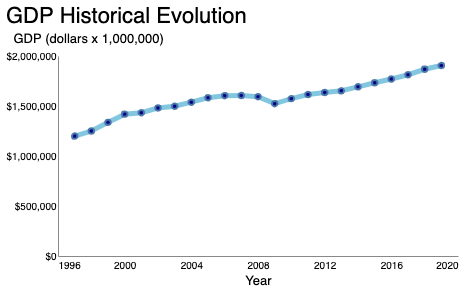

In [56]:
historical_gdp = alt.Chart(gdp, title="GDP Historical Evolution").mark_line(point=alt.OverlayMarkDef(filled=False, fill='darkblue'), size=5).encode(
                    x=alt.X('Year', axis=alt.Axis(grid=False, ticks=False, format='Y', labelFontSize=10), title='Year'),
                    y=alt.Y('sum(GDP):Q', axis=alt.Axis(grid=False, ticks=False, format=('$,f'), labelFontSize=10), title='GDP (dollars x 1,000,000)'),
                    tooltip = [alt.Tooltip('Year'), alt.Tooltip('sum(GDP):Q', format=('$,.2f'), title='Total GDP $')]).transform_filter(
                        alt.FieldEqualPredicate(field='Geography', equal= Geography)).transform_filter(
                        alt.FieldRangePredicate('Year',[1997,year])).configure_view(strokeOpacity=0).properties(height=200, width=400)

historical_gdp

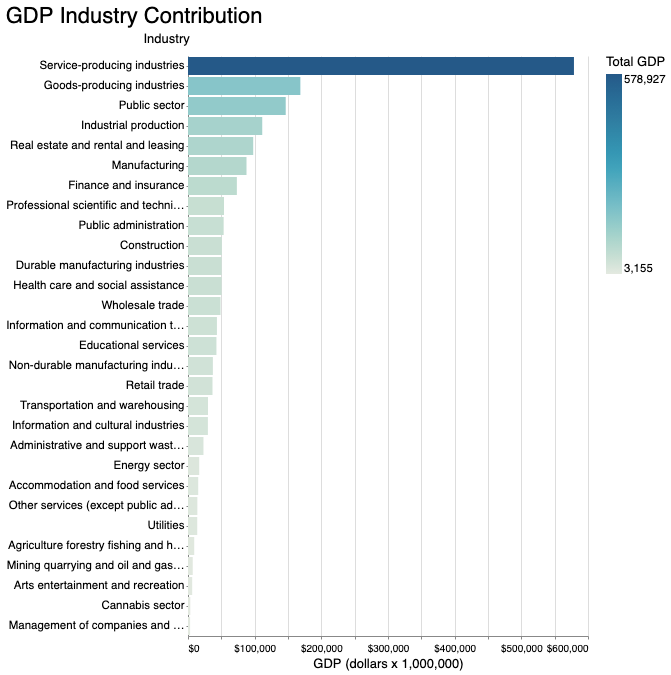

In [45]:
industry_gdp = alt.Chart(gdp, title="GDP Industry Contribution").mark_bar().encode(
                x=alt.X('sum(GDP):Q', title='GDP (dollars x 1,000,000)', axis=alt.Axis(format='$,f', labelFontSize=10)), 
                y=alt.Y('Industry:O', sort='-x'),
                color=alt.Color('sum(GDP)', title='Total GDP', scale=alt.Scale(scheme='lighttealblue')),
                tooltip=[alt.Tooltip('Industry'), alt.Tooltip('sum(GDP):Q', format=('$,.2f'), title='Total GDP $')]).transform_filter(
                    alt.FieldEqualPredicate(field='Geography', equal= Geography)).transform_filter(
                    alt.FieldEqualPredicate(field='Year', equal= year)).configure_view(strokeOpacity=0)

industry_gdp

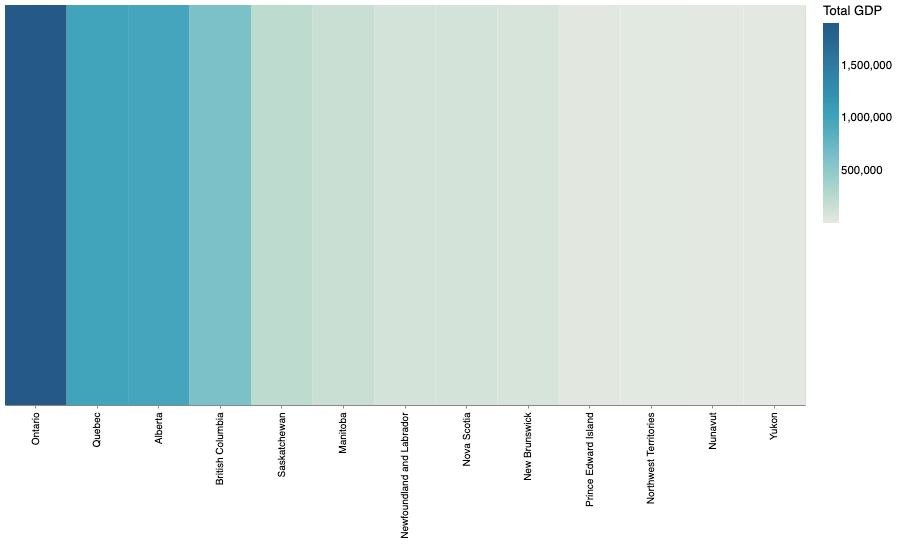

In [46]:
# The idea with this visualization is to recreate it as it is coded here but on a map of Canada

heatmap= alt.Chart(gdp).mark_rect().encode(
            x=alt.X('Geography:O', sort='-color', title=None, axis=alt.Axis(labelFontSize=10, labelAngle=-90)),
            color=alt.Color('sum(GDP)', title='Total GDP', scale=alt.Scale(scheme='lighttealblue')),
            tooltip=[alt.Tooltip('Geography'), alt.Tooltip('sum(GDP):Q', format=('$,.2f'), title='Total GDP $')]).transform_filter(
                    alt.FieldEqualPredicate(field='Year', equal= year)).properties(height=400, width=800)



heatmap

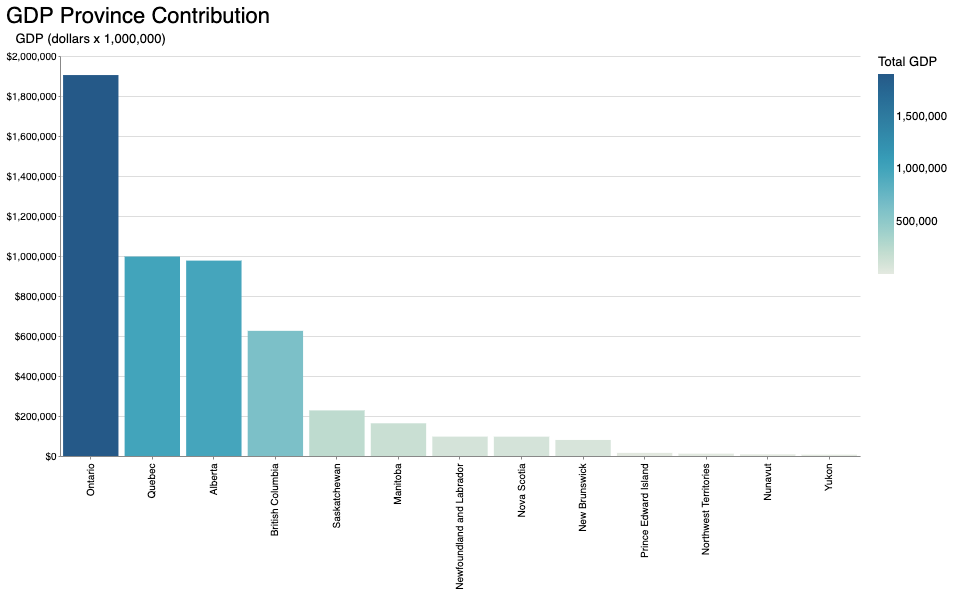

In [47]:
# The idea with this visualization is to recreate it as it is coded here but on a map of Canada

geo_gdp = alt.Chart(gdp, title="GDP Province Contribution").mark_bar().encode(
                y=alt.Y('sum(GDP):Q', title='GDP (dollars x 1,000,000)', axis=alt.Axis(format='$,f', labelFontSize=10)), 
                x=alt.X('Geography:O', sort='-y', title=None, axis=alt.Axis(labelFontSize=10, labelAngle=-90)),
                color=alt.Color('sum(GDP)', title='Total GDP', scale=alt.Scale(scheme='lighttealblue')),
                tooltip=[alt.Tooltip('Geography'), alt.Tooltip('sum(GDP):Q', format=('$,.2f'), title='Total GDP $')]).transform_filter(
                    alt.FieldEqualPredicate(field='Year', equal= year)).configure_view(strokeOpacity=0).properties(height=400, width=800)

geo_gdp

In [48]:
alt.renderers.enable('mimetype')
source = alt.topo_feature("https://gist.githubusercontent.com/Brideau/2391df60938462571ca9/raw/f5a1f3b47ff671eaf2fb7e7b798bacfc6962606a/canadaprov.json", "data")

source

UrlData({
  format: TopoDataFormat({
    feature: 'data',
    type: 'topojson'
  }),
  url: 'https://gist.githubusercontent.com/Brideau/2391df60938462571ca9/raw/f5a1f3b47ff671eaf2fb7e7b798bacfc6962606a/canadaprov.json'
})

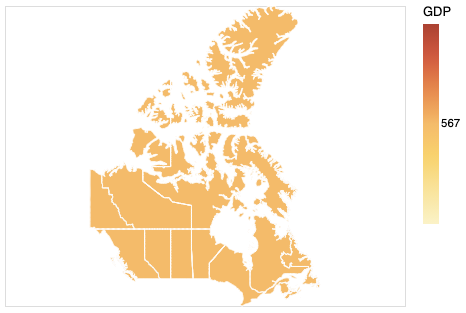

In [49]:
alt.Chart(source).mark_geoshape(stroke='white').transform_lookup(
    lookup='data',
    from_=alt.LookupData(gdp, key= 'Geography:O', fields=['Industry','Year', 'GDP'])).encode(
      color=alt.Color('GDP:Q')).transform_filter(
            alt.FieldEqualPredicate(field='Year', equal= year))

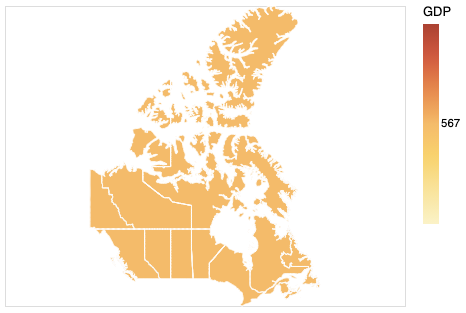

In [50]:
alt.Chart(source).mark_geoshape(stroke='white').encode(
    color=alt.Color('GDP:Q')
).transform_lookup(
    lookup='province',
    from_=alt.LookupData(gdp, 'Geography:O', list(gdp.columns))
).transform_filter(
            alt.FieldEqualPredicate(field='Year', equal= year))

<AxesSubplot:>

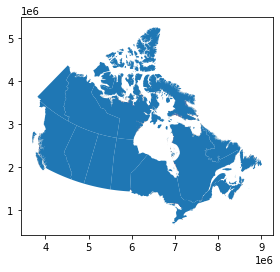

In [51]:
can.plot()

In [52]:
geo_gdp = pd.DataFrame(gdp.groupby(['Geography', 'Year'])['GDP'].sum()).reset_index()
geo_gdp

,Geography,Year,GDP
0,Alberta,1997.0,573673.0
1,Alberta,1998.0,587903.0
2,Alberta,1999.0,592881.5
3,Alberta,2000.0,623634.1
4,Alberta,2001.0,628028.5
...,...,...,...
294,Yukon,2015.0,5967.2
295,Yukon,2016.0,6404.6
296,Yukon,2017.0,6505.9
297,Yukon,2018.0,6668.9


In [53]:
merged=can.set_index('PRENAME').join(geo_gdp.set_index('Geography'))
merged.reset_index(inplace=True)
merged.drop('index', axis=1, inplace=True)

merged.head()

,PRUID,PRNAME,PRFNAME,PREABBR,PRFABBR,geometry,Year,GDP
0,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",1997.0,573673.0
1,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",1998.0,587903.0
2,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",1999.0,592881.5
3,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",2000.0,623634.1
4,48,Alberta,Alberta,Alta.,Alb.,"POLYGON ((5228304.177 2767597.891, 5228098.463...",2001.0,628028.5
